In [216]:
# import necessary libraries
import jplephem
import numpy as np 
import matplotlib.pyplot as plt
from jplephem.spk import SPK
from scipy import constants
kernel = SPK.open('de421.bsp')
np.set_printoptions(precision=3)

In [217]:
def position_array(planets, type):

    if type == "3d":
        positions_array = ([], [], [])

    if type == "2d":
        positions_array = ([], [])    
    for i in planets:
        if type == "3d":
            positions_array[0].append(i[0]/1.5e8)
            positions_array[1].append(i[1]/1.5e8)
            positions_array[2].append(i[2]/1.5e8)
        if type == "2d":
            positions_array[0].append(i[0]/1.5e8)
            positions_array[1].append(i[1]/1.5e8)

    return positions_array

def grav_potential(r, mass):

    # this function calculates the gravitational potential at a point due to contribution of an array of masses

    
    potential = -(constants.G * mass)/r

    return potential

In [218]:
import astropy
from astropy.time import Time
import astropy.units as u
from astropy.constants import M_sun, M_earth,au,G

# time package allows you to convert normal date and time to julian date
t = Time("2000-9-18 11:00")
t_jd = t.jd # converts to julian date

sun_position = kernel[0,10].compute(t.jd) 

earth_position = kernel[0,3].compute(t.jd) 

# positions are given in KM
# 1au = 1.5e8km
two_positions = (position_array((sun_position, earth_position),"2d"))*au


mass_sun = M_sun
#mass_earth = 5.972e24
mass_earth = M_earth

mass_array = []
mass_array.append(mass_sun)
mass_array.append(mass_earth)

In [219]:
# calculating angular velocity of the Earth around the sun (refine later)
omega_earth = 2*np.pi/(1*u.year.in_units(u.s))/u.s
print(omega_earth)
print(two_positions)



1.991021277657232e-07 1 / s
[[-8.128e+08  1.487e+11]
 [-6.187e+08 -1.062e+10]] m


In [224]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)


# creating the 2d array
x_coord = np.linspace(-2.5, 2.5, 1000)*au
y_coord = np.linspace(-2.5, 2.5, 1000)*au

X,Y = np.meshgrid(x_coord, y_coord)

#print(X)



def acceleration_contour(X,Y,two_positions,mass_array,omega_earth):

    # create an array of the |r| distance
    r_general  = np.sqrt(X**2 + Y**2)

    #print(r_general)

    acceleration_array = []


    # looping through each of the two positions to calculate the relative position of each mass
    # and calculating the acceleration
    for i in range(len(two_positions)):

        r_x = X - two_positions[0][i]
        r_y = Y - two_positions[1][i]

        r_planet = np.sqrt(r_x**2 + r_y**2)

        phi = (G*mass_array[i])/r_planet 

        # force = grad phi
        accel_x = -phi/r_planet * r_x/r_planet
        accel_y = -phi/r_planet * r_y/r_planet
        


        acceleration_array.append([accel_x,accel_y])

    
    # now calculating the acceleration contribution due to centripetal acceleration
    acc_cent_x = r_general * omega_earth**2 * X/r_general
    acc_cent_y = r_general * omega_earth**2 * Y/r_general

   

    # combining the acceleration contributions from planets and rotating frame
    total_a = np.sqrt((acc_cent_x + acceleration_array[0][0] + acceleration_array[1][0])**2 + (acc_cent_y + acceleration_array[0][1] + acceleration_array[1][1])**2)

    print(total_a)


    return total_a



acceleration = acceleration_contour(X,Y,two_positions,mass_array,omega_earth)



    




[[2.038e-02 2.036e-02 2.034e-02 2.032e-02 2.029e-02 2.027e-02 2.025e-02
  2.023e-02 2.021e-02 2.018e-02 2.016e-02 2.014e-02 2.012e-02 2.010e-02
  2.007e-02 2.005e-02 2.003e-02 2.001e-02 1.999e-02 1.997e-02 1.994e-02
  1.992e-02 1.990e-02 1.988e-02 1.986e-02 1.984e-02 1.981e-02 1.979e-02
  1.977e-02 1.975e-02 1.973e-02 1.971e-02 1.968e-02 1.966e-02 1.964e-02
  1.962e-02 1.960e-02 1.958e-02 1.956e-02 1.953e-02 1.951e-02 1.949e-02
  1.947e-02 1.945e-02 1.943e-02 1.941e-02 1.939e-02 1.936e-02 1.934e-02
  1.932e-02 1.930e-02 1.928e-02 1.926e-02 1.924e-02 1.922e-02 1.920e-02
  1.917e-02 1.915e-02 1.913e-02 1.911e-02 1.909e-02 1.907e-02 1.905e-02
  1.903e-02 1.901e-02 1.899e-02 1.897e-02 1.894e-02 1.892e-02 1.890e-02
  1.888e-02 1.886e-02 1.884e-02 1.882e-02 1.880e-02 1.878e-02 1.876e-02
  1.874e-02 1.872e-02 1.870e-02 1.868e-02 1.866e-02 1.864e-02 1.862e-02
  1.860e-02 1.858e-02 1.855e-02 1.853e-02 1.851e-02 1.849e-02 1.847e-02
  1.845e-02 1.843e-02 1.841e-02 1.839e-02 1.837e-02 1.835e-02 1.

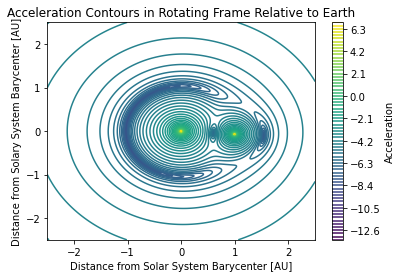

In [221]:
plt.figure("acceleration contours in rotating frame")
plt.title("Acceleration Contours in Rotating Frame Relative to Earth")
plt.contour(X/au,Y/au,np.log(acceleration.value), levels=70)
plt.xlabel("Distance from Solar System Barycenter [AU]")
plt.ylabel("Distance from Solary System Barycenter [AU]")
cbar = plt.colorbar()
cbar.ax.set_ylabel('Acceleration')
plt.show()

In [235]:
# now writing a function that will find the points of 0 acceleration (lagrange points)

def find_lagrange(X,Y,acceleration):
    # searches acceleration 2d array for smallest 5 values andd returns the corresponding coordinate

    acceleration = acceleration.value
    
    # creating an array to store the lowest values in the acceleration matrix
    # also storing their relative position
    small_acceleration = np.full(5,fill_value = np.inf)
    small_acceleration_pos = np.zeros((5,2), dtype = 'int')

    # now searching acceleration array for the lowest values
    for i in range(len(acceleration)):
        for j in range(len(acceleration[0])):
            max_acceleration = np.amax(small_acceleration)
            max_acceleration_pos = np.argmax(small_acceleration)

            # compare the max value in the small_acceleration to the component of the acceleration matrix
            if acceleration [i][j] < max_acceleration:
                small_acceleration[max_acceleration_pos] = acceleration[i][j]
                small_acceleration_pos[max_acceleration_pos][0] = i
                small_acceleration_pos[max_acceleration_pos][1] = j

    L_points = []

    # finding the corresponding coordinate in the X,Y matrix
    for i in range(len(small_acceleration_pos)):
        L_x = (X[small_acceleration_pos[i][0]][small_acceleration_pos[i][1]])/au
        L_y = (Y[small_acceleration_pos[i][0]][small_acceleration_pos[i][1]])/au

        L_points.append([L_x,L_y])




    print(small_acceleration)
    print(small_acceleration_pos)
    print(L_points)
    return L_points

L_points = find_lagrange(X,Y,acceleration)

    
    

[4.075e-06 1.379e-06 8.328e-06 1.207e-05 1.254e-05]
[[542 298]
 [537 297]
 [531 296]
 [532 296]
 [546 299]]
[[<Quantity -1.009>, <Quantity 0.213>], [<Quantity -1.014>, <Quantity 0.188>], [<Quantity -1.019>, <Quantity 0.158>], [<Quantity -1.019>, <Quantity 0.163>], [<Quantity -1.004>, <Quantity 0.233>]]


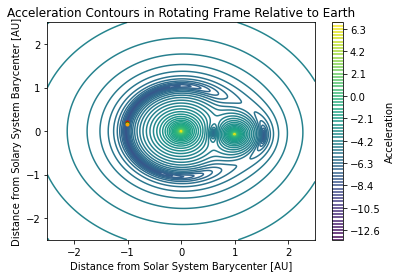

In [236]:
plt.figure("acceleration contours in rotating frame")
plt.title("Acceleration Contours in Rotating Frame Relative to Earth")
plt.contour(X/au,Y/au,np.log(acceleration.value), levels=70)
plt.plot(L_points[0][0], L_points[0][1],".", c ="red" )
plt.plot(L_points[1][0], L_points[1][1],".", c ="green" )
plt.plot(L_points[2][0], L_points[2][1],".", c ="orange" )
plt.xlabel("Distance from Solar System Barycenter [AU]")
plt.ylabel("Distance from Solary System Barycenter [AU]")
cbar = plt.colorbar()
cbar.ax.set_ylabel('Acceleration')
plt.show()

need to figure out a way to distinguish the lowest points so i can find multiple lagrange points

change function to take time series positions to find evolution of lagrange points
